# YouTube API - Data Collection

### Installing requirements

The next cell will install/update all required packages for this project:

In [1]:
#to reflect changes made in modules
%load_ext autoreload
%autoreload 2

In [2]:
# !pip -q install --upgrade -r ../requirements.txt
# print("Packages successfully installed and up-to-date.")

# Set up

Setting API keys and creating class instances

**YT_KEY** = your YouTube API Key.<br>
**DB_KEY** = key to connect to MongoDB.

In [3]:
DB_KEY =  <ADD KEY HERE> # connect to database here (see owners for access)
YT_KEY =  <ADD KEY> #insert own youtube api key here

In [4]:
import os, sys
import pandas as pd
import plotly.express as px #06.08.20
sys.path.append(os.path.join(sys.path[0], '../'))

from wildbook_social import YouTube, Database, Visualize, Geospatial

#distance visualization
import plotly.graph_objects as go
import plotly.io as pio
import numpy as np

#posts per week plots
%matplotlib inline
import matplotlib.pyplot as plt

In [5]:
db = Database(DB_KEY, 'youtube') 
yt = YouTube(YT_KEY, db)
nameOfDb = 'youtube'

db_obj = db.getDB()
vs = Visualize(db_obj, 'youtube')
geo = Geospatial(db_obj)

# Query YouTube Data API

Choose query term + appropriate set of parameters to get data from YouTube

In [6]:
#uncomment the appropriate query and saveTo term for the species you wish to retrieve results from

query = "Humpback Whale | Humpback Whales -octonauts, -top 10, -my top 10, -facts, -learning, -kids, -draw, -art, -cartoon, -toy, -songs, -album, -games"
saveTo = "humpback whales"
csvName = 'humpbackWhales'

# query = 'whale sharks| whale shark | butanding'# -octonauts, -top 10, -basking, -megalodon, -kids, -cartoon, -feed and grow fish, -pungence, -DIY, -toys, -draw, -gameplay, -hungry shark world, -manta ray, -white shark, -blue'
# saveTo = "new whale sharks test"
# csvName = 'new whale sharks'

# query = 'iberian lynx |lince| lince ibérico -Apex, -LRH, -Playoffs, -Game, -Draw, -Floor, -Music, -Sport, -Puzzle, -MMA, -felt, -kids, -eurasian, -documentary'
# saveTo = 'iberian lynx'
# csvName = 'iberianLynx'

# query = 'reticulated giraffe' # | giraffe -kids ' #|giraffe|giraffe encounter #-diy, -top 10, -kids, -children, -peppa pig, -compilation, -roblox, -tycoon'#'reticulated giraffe'
# saveTo = 'Reticulated Giraffe' #move to a new collection since old one is filled with spam
# csvName = 'retGiraffe'

# query = "zebra|zebras|grevys zebra -warhol, -diy, -DIY, -tutorial, -V3, -V2, -facts, -katz, -audio, -cake"
# saveTo = 'grevys zebra'
# csvName = 'grevysZebra'

# query = "zebra|zebras|plains zebra|common zebra, -warhol, -diy, -DIY, -tutorial, -V3, -V2, -facts, -wildebeests,-lions, -migration"
# saveTo = 'plains zebras'
# csvName = 'plainsZebra'

## General Term Testing - run a query with a more generalized query term to possibly increase volume of posts gathered

In [6]:
# query = "zebra"
# saveTo = 'grevys zebra general'
# csvName = 'grevysZebraGeneral'

# query = "zebra"
# saveTo = 'plains zebra general'
# csvName = 'plainsZebraGeneral'

# query = 'giraffe' 
# saveTo = 'Reticulated Giraffe general' #move to a new collection since old one is filled with spam
# csvName = 'retGiraffeGeneral'

# query = 'lynx' 
# saveTo = 'iberian lynx general'
# csvName = 'iberianLynxGeneral'

### Querying and saving

The next cell will query the videos from YouTube and automatically save them into MongoDB:

In [7]:
#can change this value for user preferences (depending on how many results needed)
howManyVideosToQuery = 100
res = yt.search(q=query, limit=howManyVideosToQuery, saveTo=saveTo)

Done!


# Manual Filtration

The next cells will run a script to get unchecked videos from Youtube's MongoDB database one by one for manual checking. The user will be prompted to label the video as (1) relevant (does it contain the animal of interest?) and (2) assign a captivity status (wild or not) if the video is relevant. Additionally, if a location is mentioned during the video, the user will have the chance to enter a "location" for the encounter since YouTube does not provide lat/long coordinates for videos.

In [7]:
print(saveTo)

humpback whales


Amount:  100
1: Humpback Whale Heat Run (Plus Dolphins) - Underwater


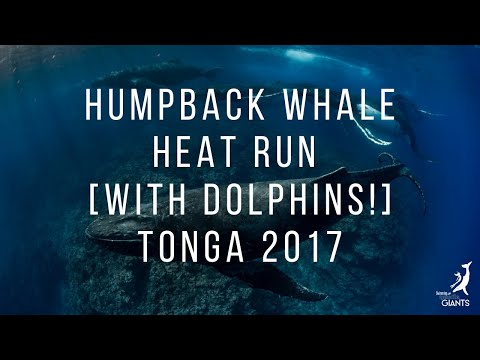

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  99
2: Humpback Whales French Pass New Zealand


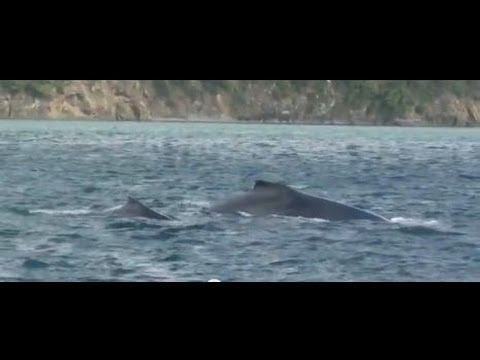

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 French Pass, New Zealand


Response saved! Location : French Pass, New Zealand.

Response saved! Relevant and Wild.

Amount:  98
3: Whale Watching from Reykjavik with Special Tours


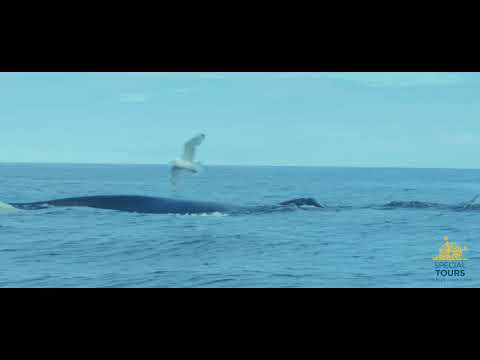

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Reykjavík, Iceland


Response saved! Location : Reykjavík, Iceland.

Response saved! Relevant and Wild.

Amount:  97
4: Humpback Whale Watching Iceland Akureyri


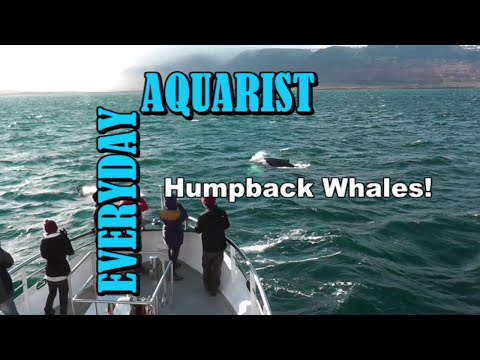

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Akureyri, Iceland


Response saved! Location : Akureyri, Iceland.

Response saved! Relevant and Wild.

Amount:  96
5: 12.10.13 Humpback Whales &amp; Risso&#39;s Dolphins on the Star of Monterey


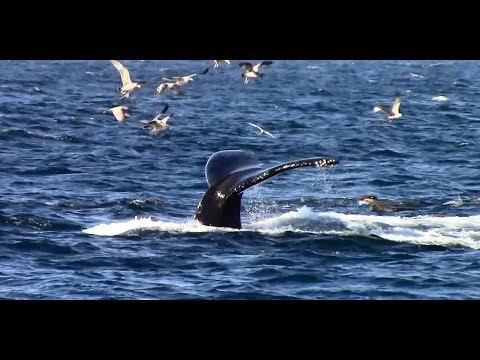

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

Amount:  95
6: Whale Watching Cabo Season 2018-19


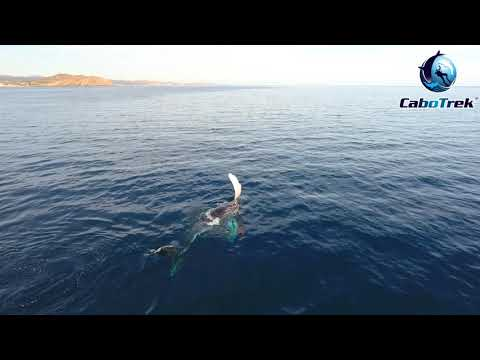

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Cabo


Response saved! Location : Cabo.

Response saved! Relevant and Wild.

Amount:  94
7: Beach Whale in Newport Beach


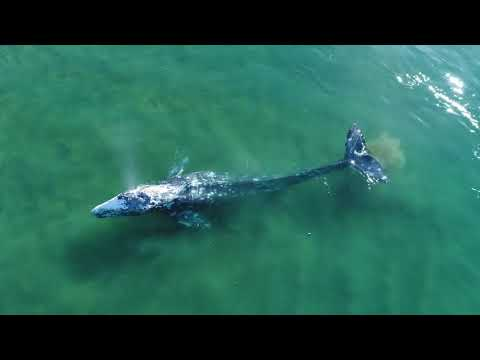

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  93
8: 8.10.15 Humpback Whales &amp; Common Dolphins #BigBlueLive #Monterey


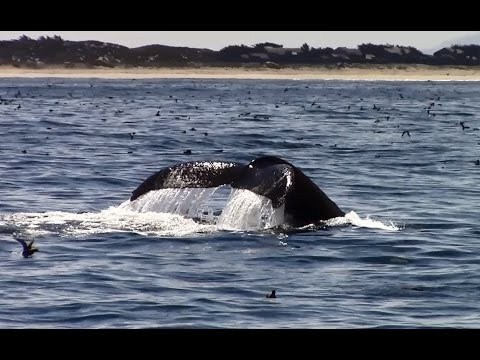

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey, Bay


Response saved! Location : Monterey, Bay.

Response saved! Relevant and Wild.

Amount:  92
9: Humpback whale under the dive boat in Tenerife!!


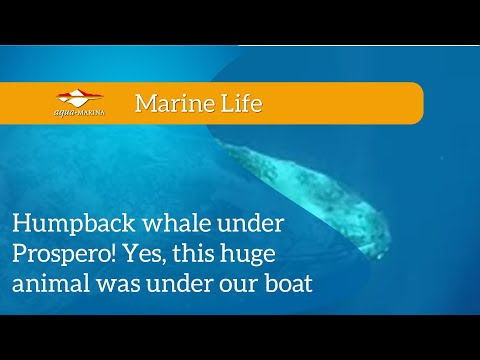

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  91
10: 7/26/16 Blues, Humpbacks and Fin Whales in the smoke and fog


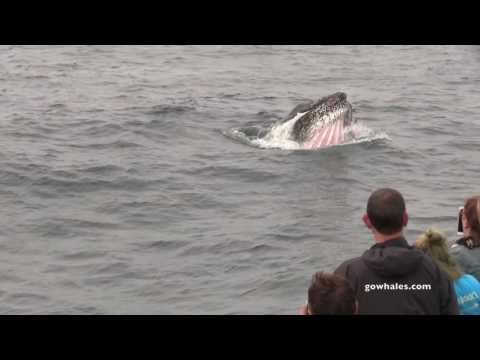

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  90
11: Humpback Whales from Halona Blowhole Overlook


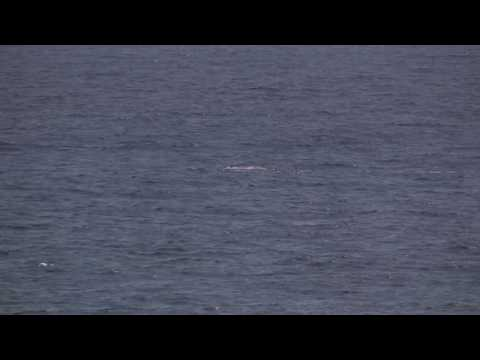

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Halona Blow Hole Lookout, Hawaii


Response saved! Location : Halona Blow Hole Lookout, Hawaii.

Response saved! Relevant and Wild.

Amount:  89
12: Humpback whales breaching off Cape Cod 8/2/10


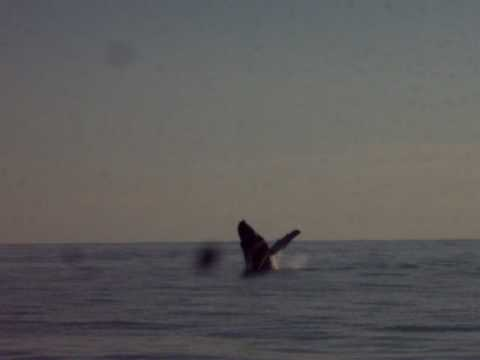

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Cape Cod


Response saved! Location : Cape Cod.

Response saved! Relevant and Wild.

Amount:  88
13: Humpback whale strays in Hong Kong waters


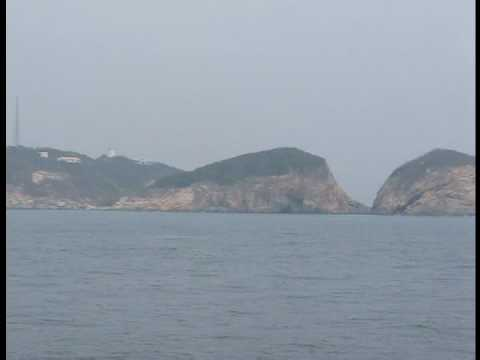

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  87
14: Oshan Whale Watch Scratchy the Humpback Whale 2/5


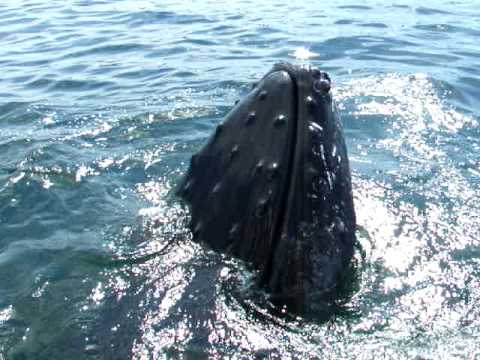

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  86
15: Whale Watching &amp; Wildlife Quest


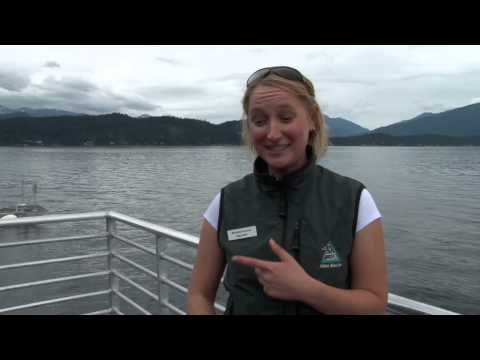

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  85
16: Amazing Contact with Humpback Whale in Vancouver by Clinton - www.possibilitymanagement.org


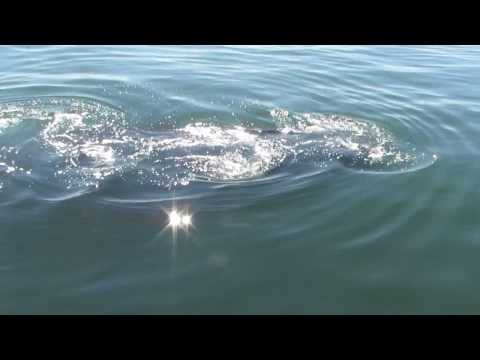

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Vancouver


Response saved! Location : Vancouver.

Response saved! Relevant and Wild.

Amount:  84
17: Humpback Whales off Mackay ~ 2010 QLD Australia


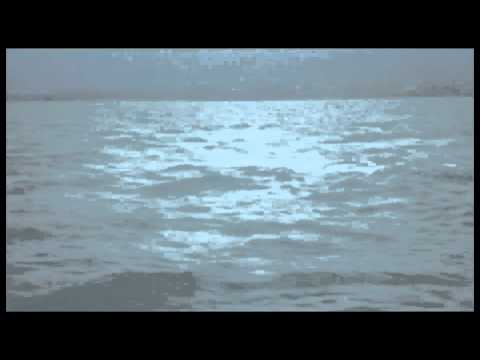

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  83
18: Whale Watching tour, Gloucester MA.


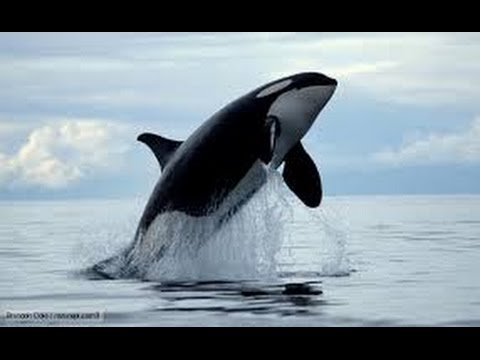

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Gloucester, Massachusetts


Response saved! Location : Gloucester, Massachusetts.

Response saved! Relevant and Wild.

Amount:  82
19: Humpback whale watching in Newfoundland - 2013


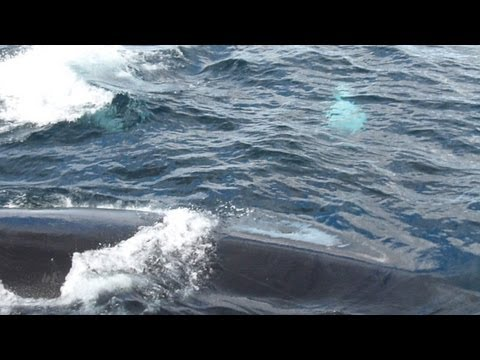

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Newfoundland


Response saved! Location : Newfoundland.

Response saved! Relevant and Wild.

Amount:  81
20: 2013-01-10 Humpback and Dolphins


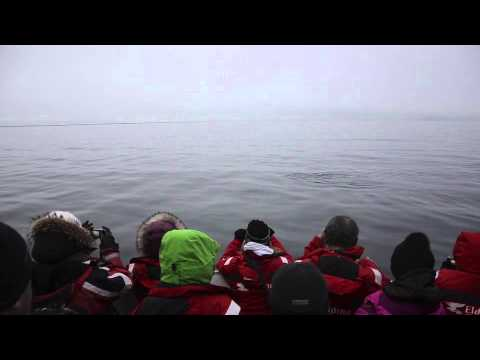

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Reykjavík, Iceland


Response saved! Location : Reykjavík, Iceland.

Response saved! Relevant and Wild.

Amount:  80
21: Humpback Whales in Grand Turk, Turks and Caicos


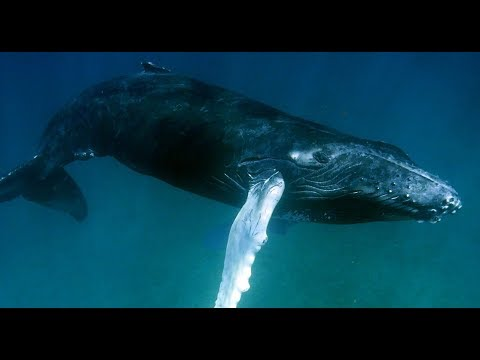

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Turks and Caicos Islands


Response saved! Location : Turks and Caicos Islands.

Response saved! Relevant and Wild.

Amount:  79
22: Niue Whale Research, Trailer


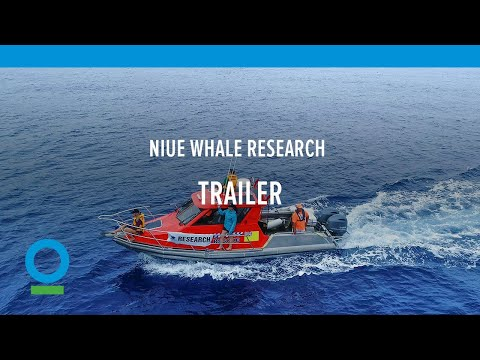

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  78
23: 4.4.17 Humpback Whales &amp; Pacific Right Sided Dolphin #Monterey #Adventure #Travel


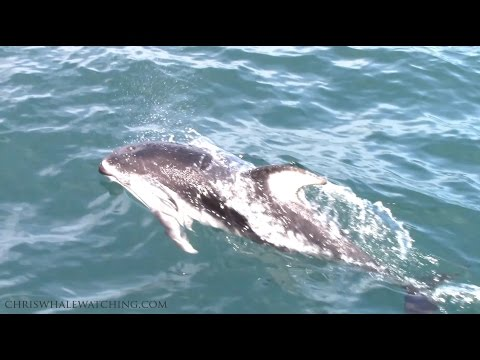

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

Amount:  77
24: Humpback Whale Sighting in Virginia Beach


Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  76
25: Samaná Bay, Dominican Republic where Humpback Whales migrate to Reproduce


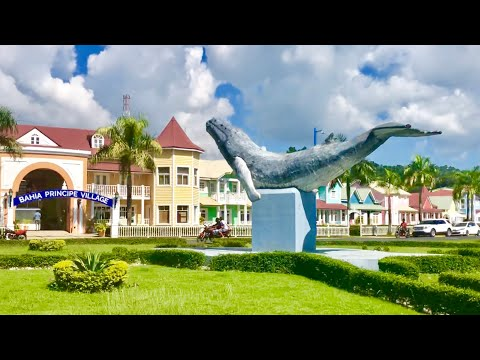

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  75
26: Maui Whales 1/15/2019. Romance, Humpback whale style, is alive and well off the Maui coast!


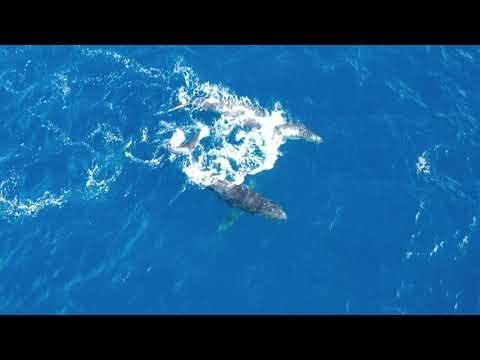

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Maui


Response saved! Location : Maui.

Response saved! Relevant and Wild.

Amount:  74
27: Swimming with Linda, Baby Humpback Whale in Silver Bank, Dominican Republic


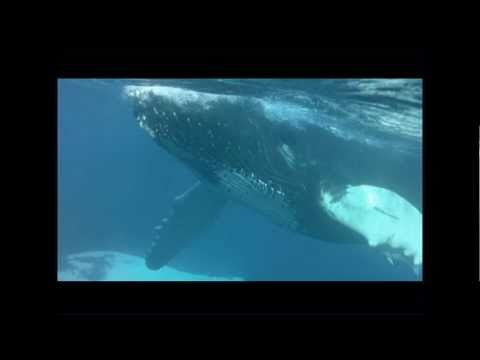

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Silver Bank, Dominican Republic


Response saved! Location : Silver Bank, Dominican Republic.

Response saved! Relevant and Wild.

Amount:  73
28: Killer Whale Island | Mystery Of The Lost Islands


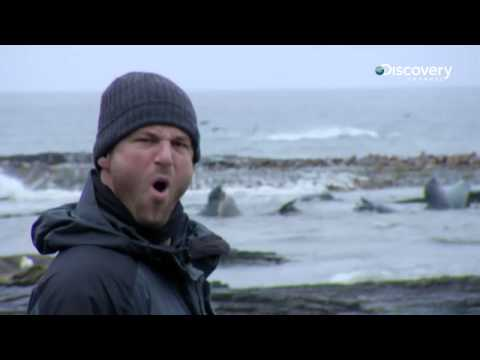

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  72
29: Humpback whale decided to scratch her back on our boat


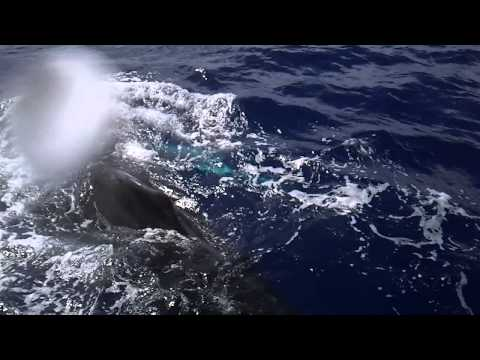

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  71
30: Juneau - Whale Quest &amp; Orca Point Lodge


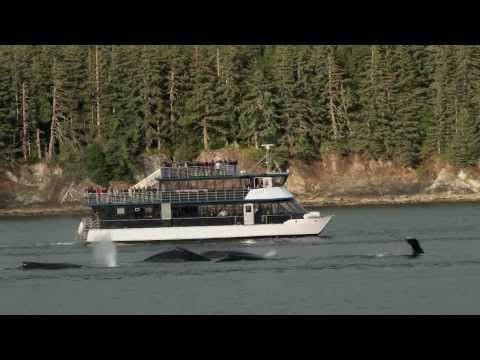

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Juneau, Alaska


Response saved! Location : Juneau, Alaska.

Response saved! Relevant and Wild.

Amount:  70
31: A sighting of 500 Whales!


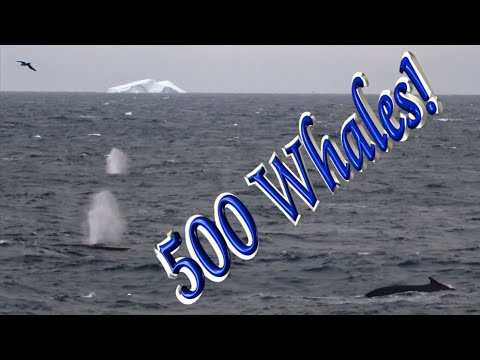

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  69
32: Top 10 things to do in Pan Pacific Nirwana Bali


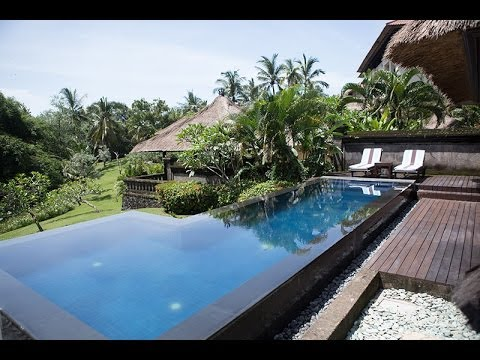

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  68
33: Destination WA - Whale Watching


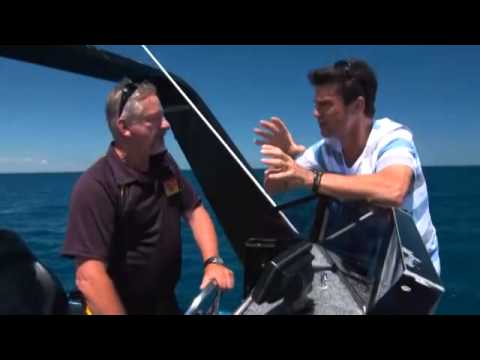

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  67
34: Stranded Humpback Whale Dies on BC Beach


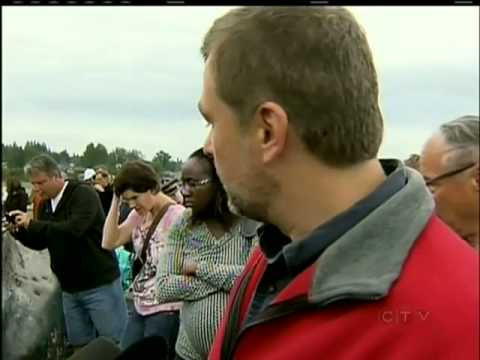

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  66
35: Elding Whale Watching Reykjavik 2012-06-13 Humpback whale


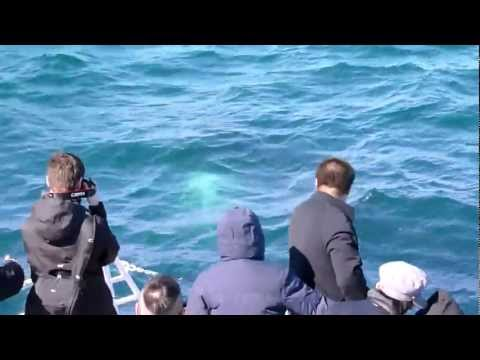

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Reykjavik, Iceland


Response saved! Location : Reykjavik, Iceland.

Response saved! Relevant and Wild.

Amount:  65
36: Humpback Whale Trapped in Southern California&#39;s Ventura Harbor


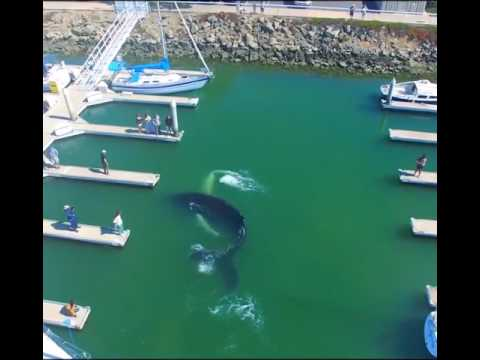

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Ventura Harbor, California


Response saved! Location : Ventura Harbor, California.

Response saved! Relevant and Wild.

Amount:  64
37: Humpback whale watching with Ocean Extreme in Sydney, Australia.


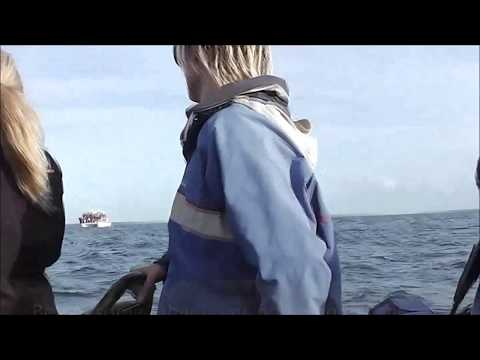

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  63
38: WWF 혹등고래 (Humpback whale)의 거품 그물 치기(bubble net feedig) 사냥법


Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  62
39: Humpback whale breach and then up close and personal


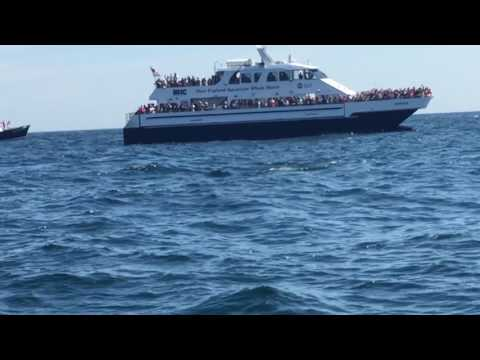

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  61
40: Free diving with humpback whales. [Surfholidays, серфинг]


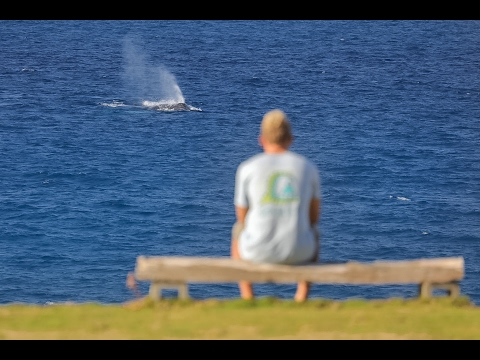

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  60
41: Akureyri Whale Watching in Iceland by Ambassador.


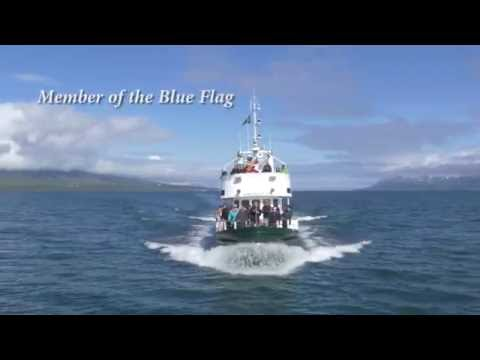

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 akureyri, iceland


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  59
42: A humpback whale beached itself and died off Dangerpoint, South Africa


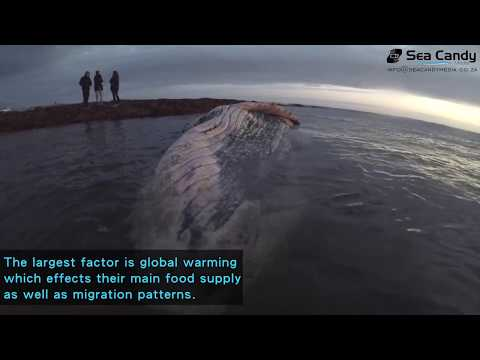

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  58
43: Southern right whales visit the Gold Coast and rest in the shallows


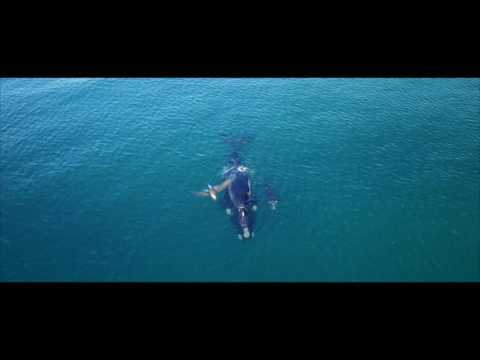

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  57
44: Nature TV - Moments in Eternity - humpback whales in Tahiti


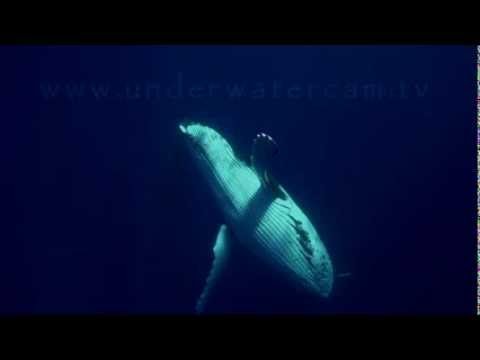

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Tahiti


Response saved! Location : Tahiti.

Response saved! Relevant and Wild.

Amount:  56
45: 11.25.13 Humpback Whales feeding on Anchovies &amp; Risso&#39;s Dolphins.


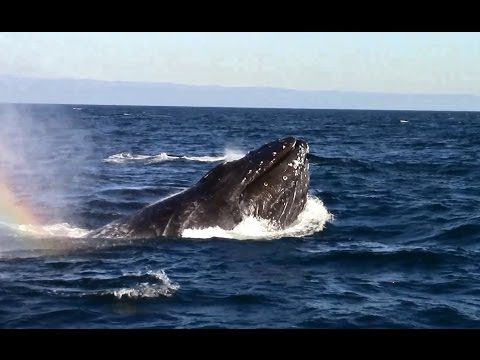

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

Amount:  55
46: Humpback Whales at Hawaii Maui Pacific Ocean


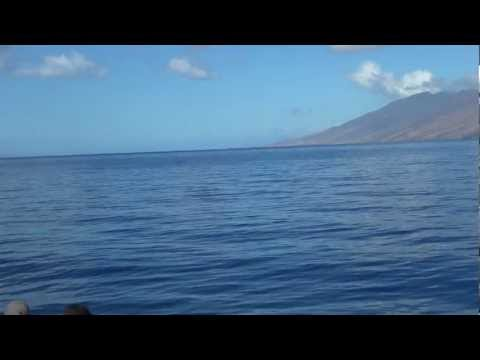

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  54
47: Humpback Whale almost kills people


Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  53
48: 9.30.16 Humpback Whales &amp; Bottlenose Dolphin #Monterey #Travel #Adventure


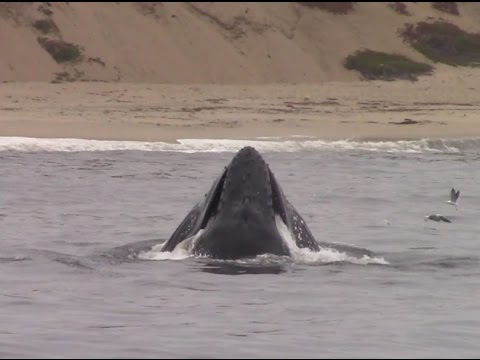

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

Amount:  52
49: Humpback Whales Isla Contadora, Las Perlas Islands, Panama


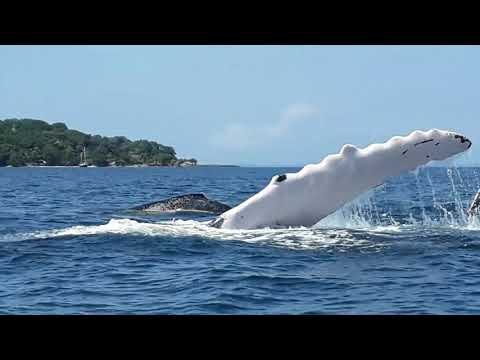

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Las Perlas Islands, Panama


Response saved! Location : Las Perlas Islands, Panama.

Response saved! Relevant and Wild.

Amount:  51
50: Humpback whales at centre of pipeline politics


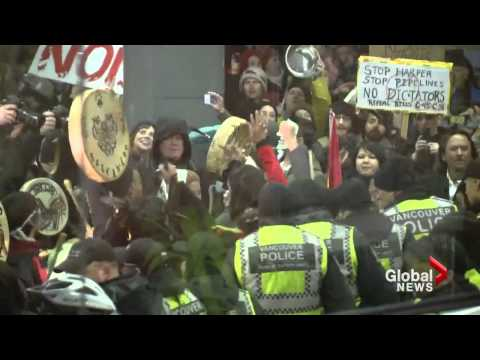

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  50
51: Humpback whales, birds and whale watching boat off San Francisco


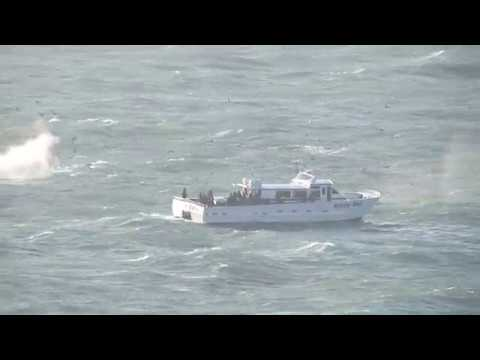

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 San Francisco


Response saved! Location : San Francisco.

Response saved! Relevant and Wild.

Amount:  49
52: Port Eliza Inlet and Humpback Whales


Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  48
53: 2010 Samana Humpback Whale Project


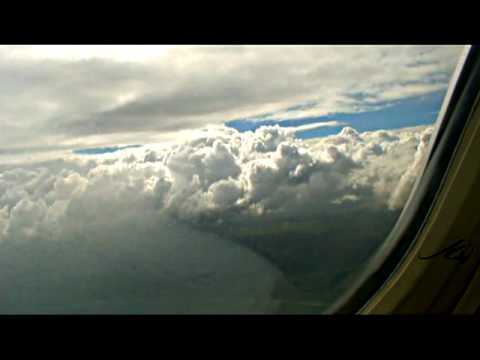

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  47
54: The Whales Of Bishop Bay Hot Spring - Ep. 131 RAN Sailing


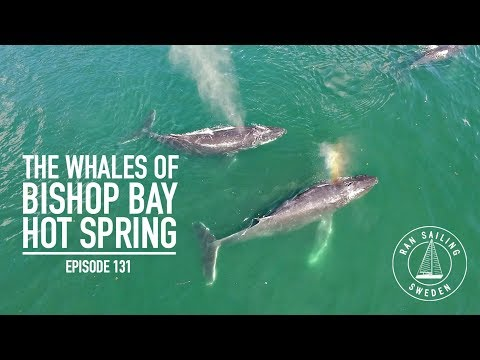

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Bishop Bay Hot Springs, Canada


Response saved! Location : Bishop Bay Hot Springs, Canada.

Response saved! Relevant and Wild.

Amount:  46
55: 9.20.13 &quot;AMAZING FRIENDLY&quot; Humpback Whales on the Monterey Bay!


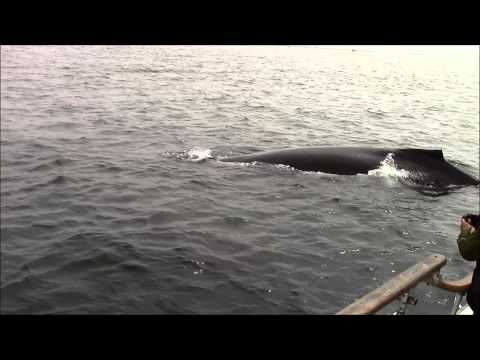

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

Amount:  45
56: Studying right whale carcasses to discover what’s causing their deaths


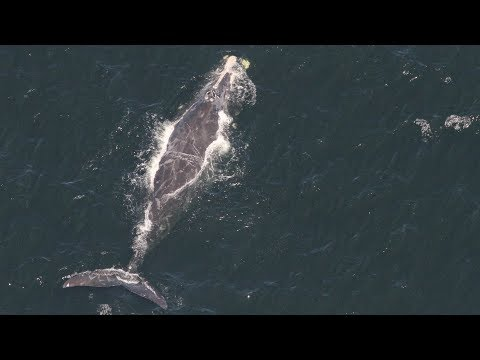

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  44
57: Humpback Mom brings Baby to Dana Point


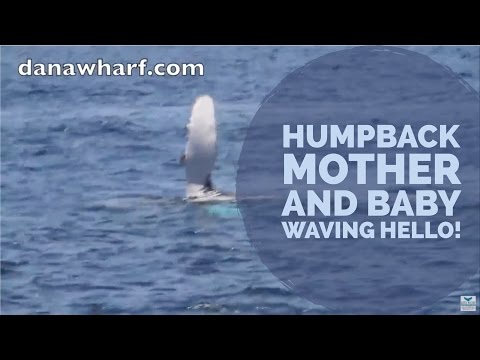

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Dana Point, California


Response saved! Location : Dana Point, California.

Response saved! Relevant and Wild.

Amount:  43
58: The Best Whale Watching Experience in San Diego


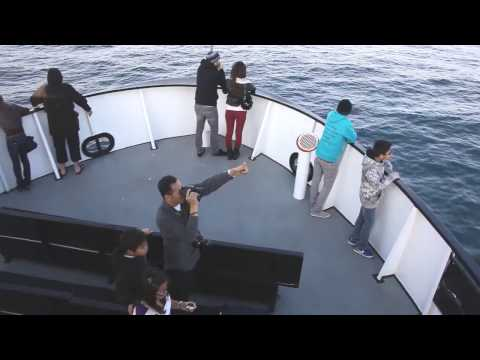

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  42
59: Whale Watching with Kim Beddall | Go Dominican Republic


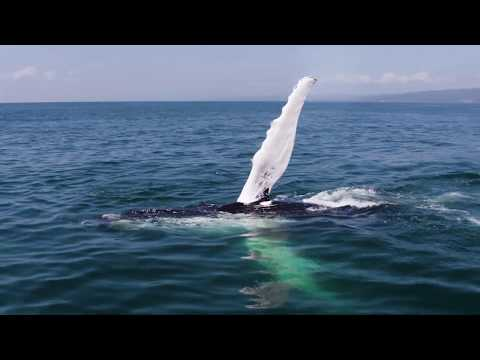

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Samana Bay, Dominican Republic


Response saved! Location : Samana Bay, Dominican Republic.

Response saved! Relevant and Wild.

Amount:  41
60: Humpback Bubblenet Feeding at Legacy Lodge, River&#39;s Inlet, B.C.


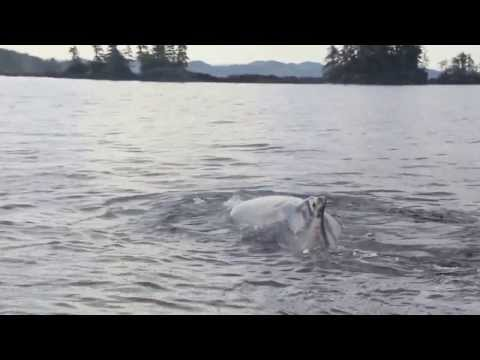

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 River's Inlet, British Columbia, Canada


Response saved! Location : River's Inlet, British Columbia, Canada.

Response saved! Relevant and Wild.

Amount:  40
61: The Ultimate Adventure Experience | Campbell River


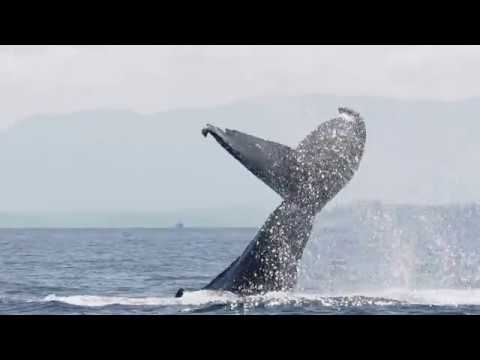

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 campbell river, british columbia, canada


Response saved! Location : campbell river, british columbia, canada.

Response saved! Relevant and Wild.

Amount:  39
62: Elding Whale Watching Reykjavík - Humpback Whale feeding next to our boats!


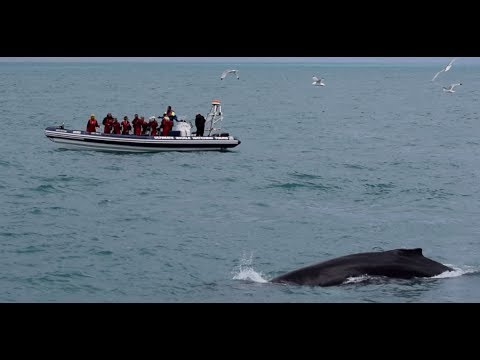

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Reykjavík, Iceland


Response saved! Location : Reykjavík, Iceland.

Response saved! Relevant and Wild.

Amount:  38
63: 7/3/16 Breaching &amp; Lunge Feeding Humpback Whale


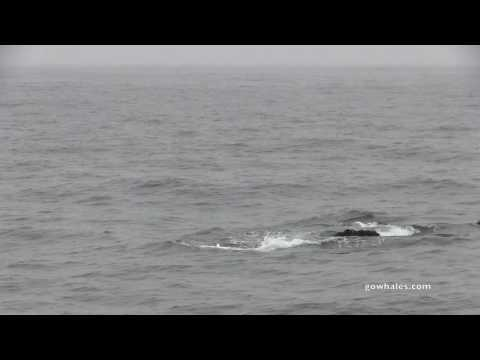

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  37
64: [NA PALI RIDERS RAFT TOURS] Humpback Whales of Kauai


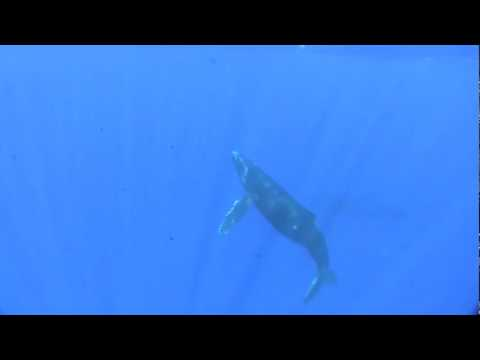

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Kauai


Response saved! Location : Kauai.

Response saved! Relevant and Wild.

Amount:  36
65: Total Travel Addicts - Humpback Whales - Rarotonga, Cook Islands


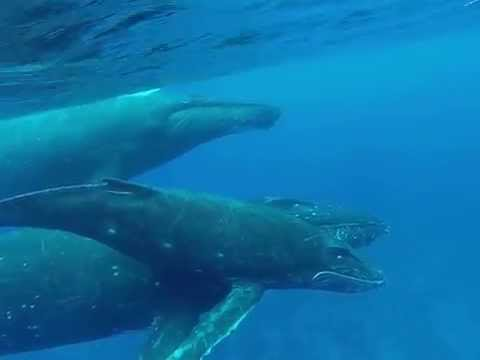

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Rarotonga, Cook Islands


Response saved! Location : Rarotonga, Cook Islands.

Response saved! Relevant and Wild.

Amount:  35
66: Pregnant white shark feasts upon dead whale Scarlett in Dana Point


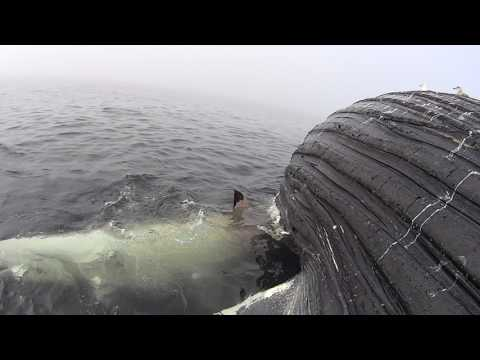

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  34
67: Humpback Whale in Boston Harbor


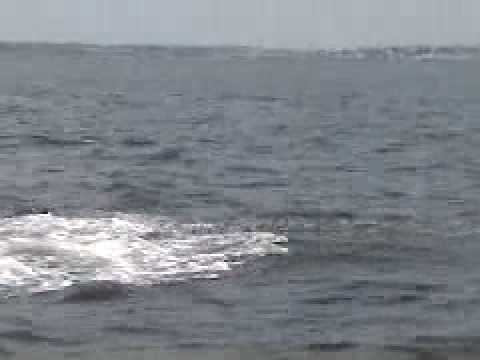

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  33
68: Swimming with Orcas and Humpbacks in Norway


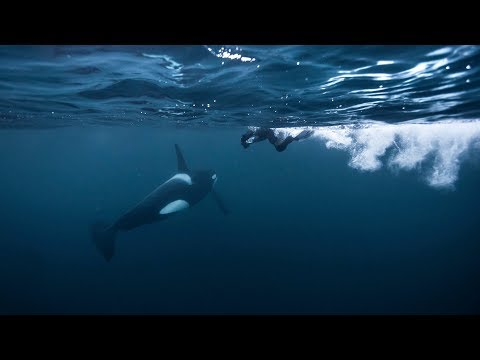

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Norway


Response saved! Location : Norway.

Response saved! Relevant and Wild.

Amount:  32
69: Humpback whale footage captured by UK Coastguard helicopter during training


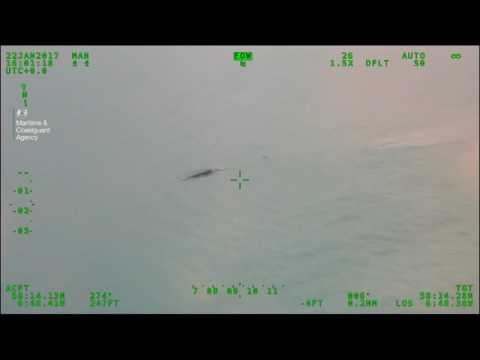

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  31
70: 9.26.14 Humpback Whales &amp; California Sea Lions


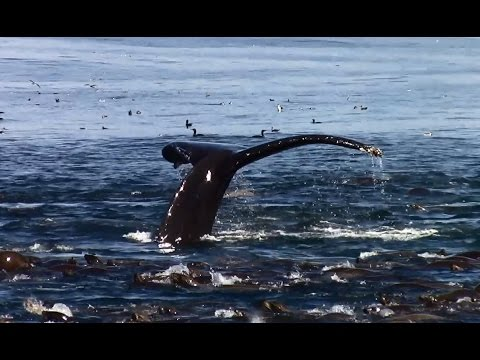

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  30
71: Niue Whale Research, Episode 5, Tagging Niue’s Whales


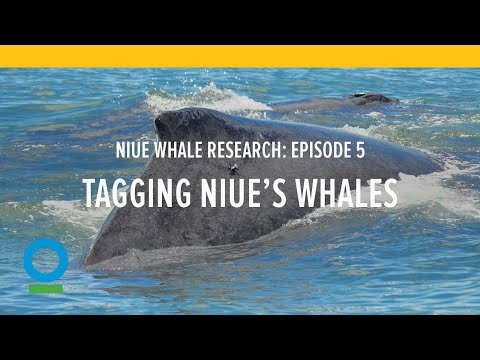

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  29
72: 10.16.17 Orca / Killer Whales, Humpback Whales, Blue Shark &amp; Risso&#39;s Dolphin #Monterey


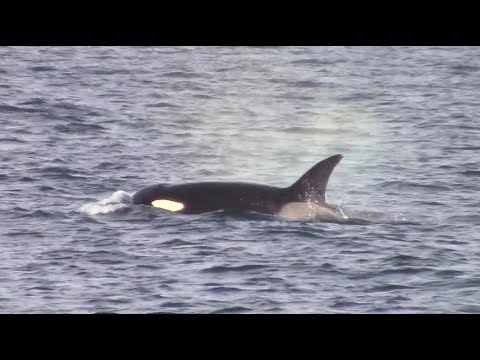

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

Amount:  28
73: Join us for a Whale Watching Trip in Hermanus


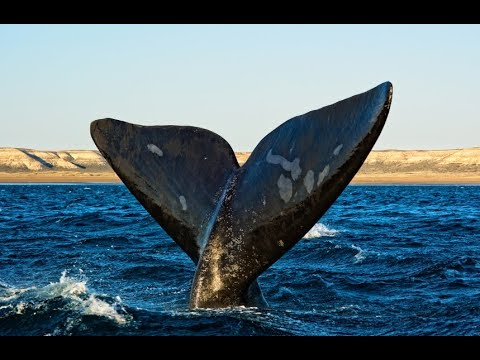

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  27
74: Φάλαινα πέφτει σε καγιάκ. (Video)-Humpback Whale Breaches on Top of Kayakers


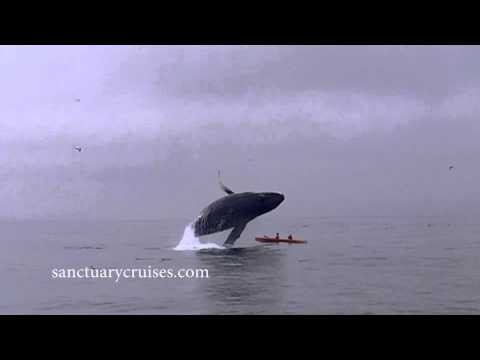

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

Amount:  26
75: Best Videos Compilation Week 3 January 2017 || JukinVideo


Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  25
76: Humpback Whale (Megaptera novaeangliae) jumping


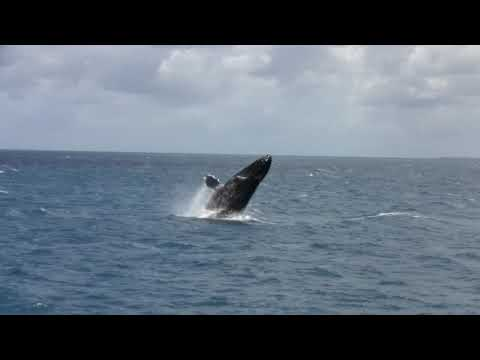

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  24
77: Elding Whale Watching Reykjavik 2012-04-21 Humpback Whales do amazing things


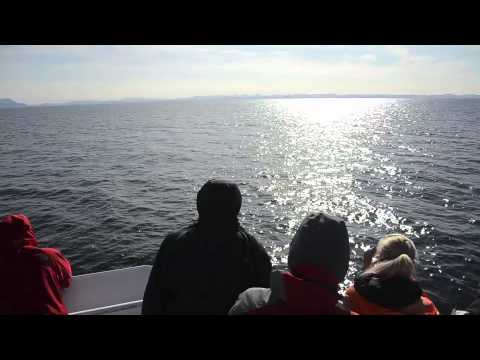

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Reykjavik, Iceland


Response saved! Location : Reykjavik, Iceland.

Response saved! Relevant and Wild.

Amount:  23
78: Drone Films Blue Whale off Dana Point, California


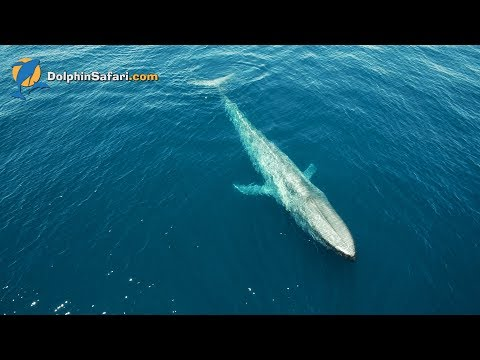

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  22
79: Humpback whales thriving thanks to hunting ban


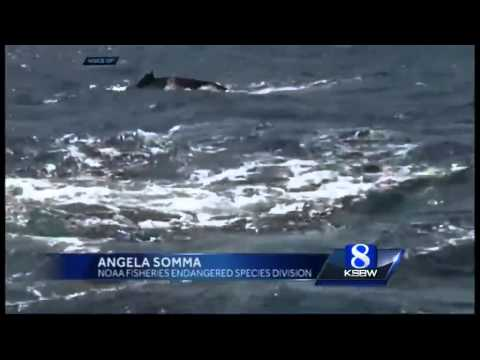

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  21
80: 3.21.14 Orcas / Killer Whales &amp; Humpback Whales Monterey


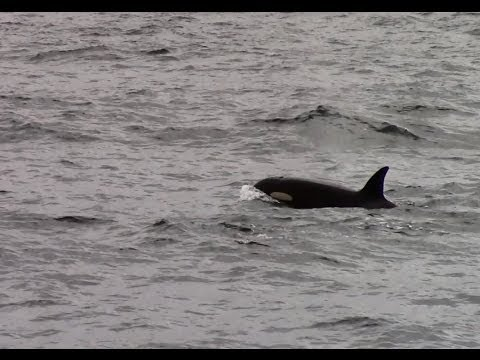

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

Amount:  20
81: Humpback whale video- Charleston, SC


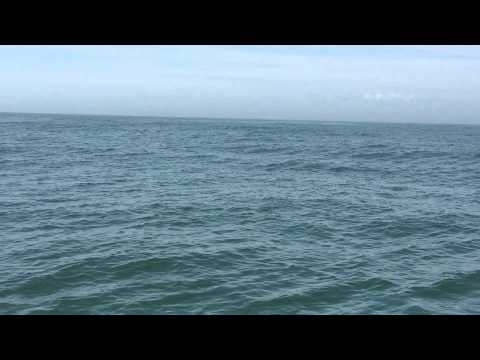

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Charleston, South Carolina


Response saved! Location : Charleston, South Carolina.

Response saved! Relevant and Wild.

Amount:  19
82: Jamie&#39;s Whaling Station Tofino &amp; Ucluelet


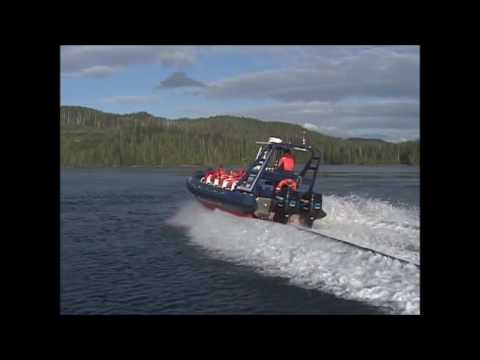

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  18
83: Boneworms on dead whales in Monterey Bay


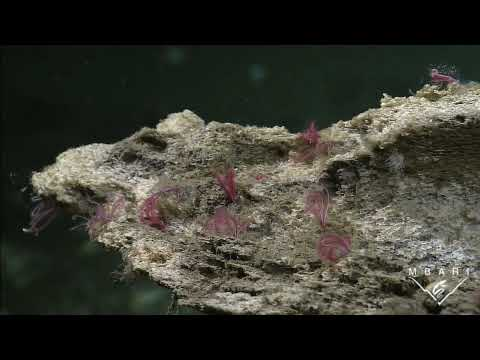

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  17
84: Flagship Whale Watching: Getaway San Diego


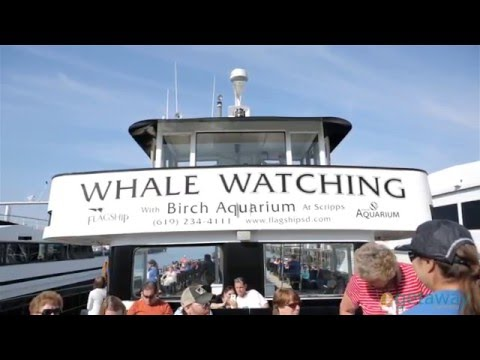

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 San Diego


Response saved! Location : San Diego.

Response saved! Relevant and Wild.

Amount:  16
85: Black Desert |  Hunting Humpback Whale


Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  15
86: Drone Captures Humpback Whale Cruising in Seattle


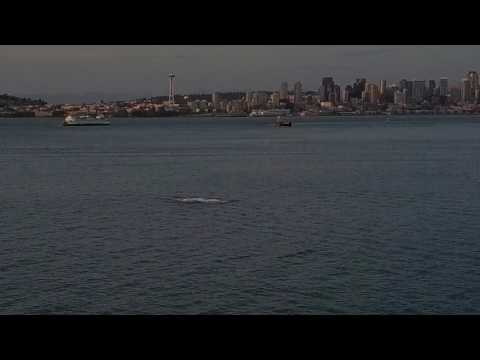

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Seattle, Washington


Response saved! Location : Seattle, Washington.

Response saved! Relevant and Wild.

Amount:  14
87: Princess Monterey Whale Watching Orca and Humpback Whale encounter 5/3/2012


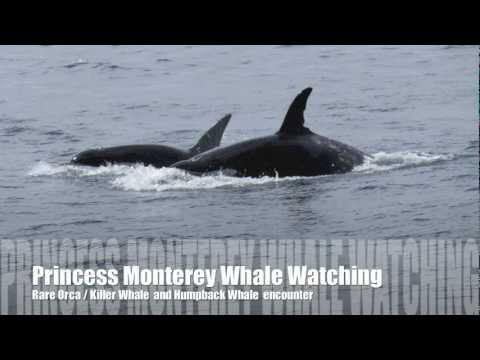

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  13
88: Mugged by a humpback whale


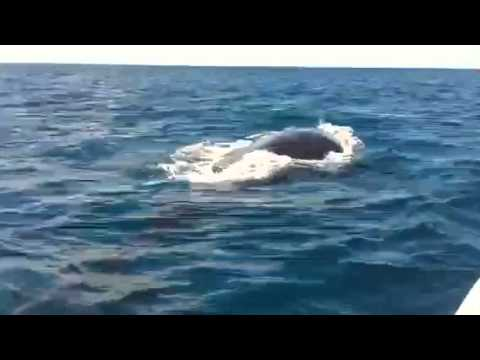

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  12
89: MAN AND BEAST - Part 47


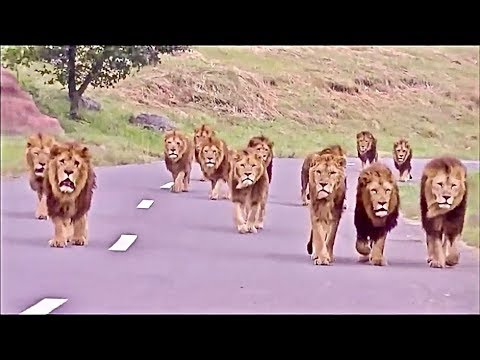

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  11
90: Whale Watching - Sydney


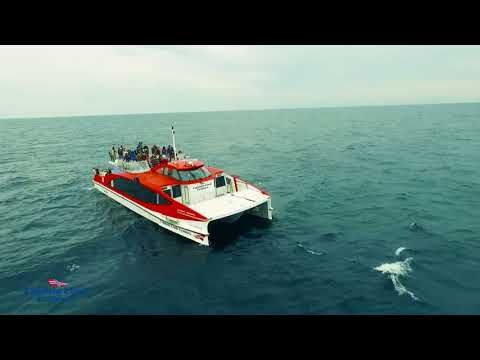

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Sydney, Australia


Response saved! Location : Sydney, Australia.

Response saved! Relevant and Wild.

Amount:  10
91: Crews Free Entangled Humpback Whale Near Maui


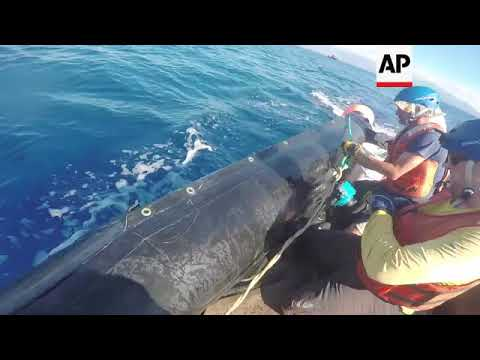

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Maui


Response saved! Location : Maui.

Response saved! Relevant and Wild.

Amount:  9
92: Humpback whales. Kuprotieji banginiai. Vaivos Video 3


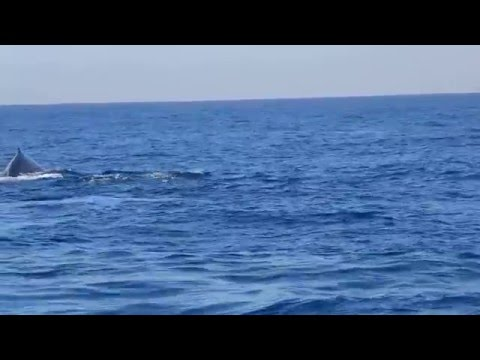

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 n


Response saved! Location : 0.

Response saved! Relevant and Wild.

Amount:  8
93: Kayak the Realm of the Whales in British Columbia


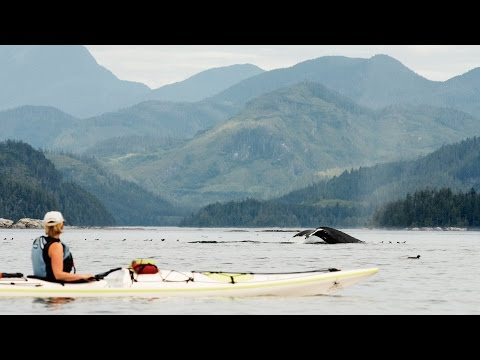

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  7
94: Sept 30th, 2018 - Very active Humpback Whale North Puget Sound


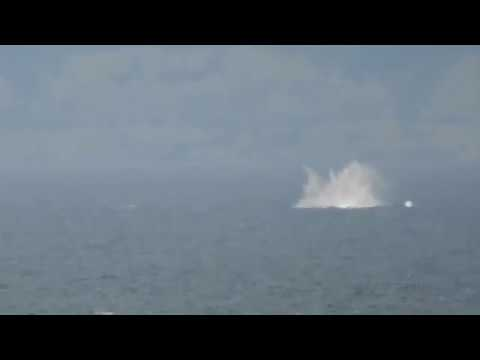

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  6
95: Oceanside Whale Watching encounters 2 Gray&#39;s


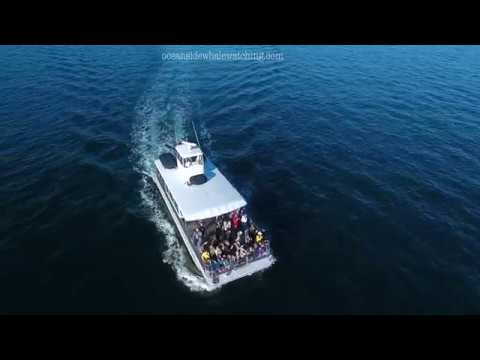

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  5
96: 8.27.14 Humpback Whales &amp; Risso&#39;s Dolphins on the Star of #Monterey


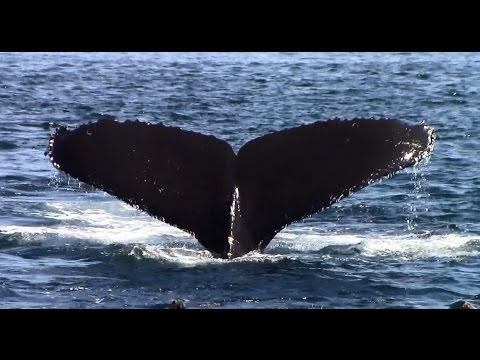

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

Amount:  4
97: Orcas, Andenes, Norway - January 2017


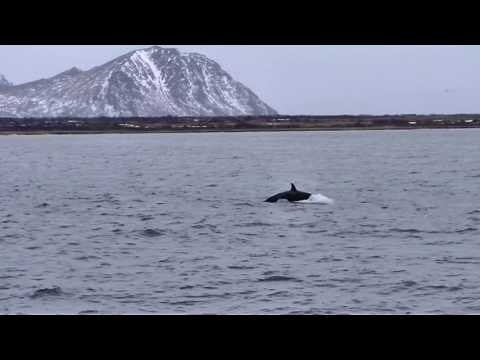

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  3
98: Common Dolphins surround Whale Watching Catamaran


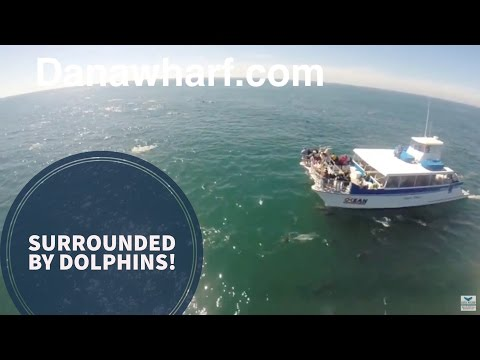

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  2
99: Sharks, jaws, Great white. The Big Five  2018 HD Documentary.


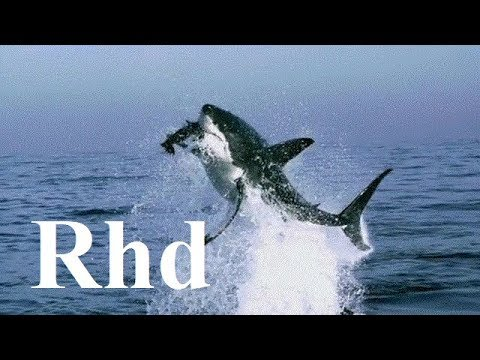

Relevant (y/n): 

 n


Response saved! Location : 0.

Response saved! Not relevant and Not wild.

Amount:  1
100: Lunge Feeding Humpback Whales #Monterey


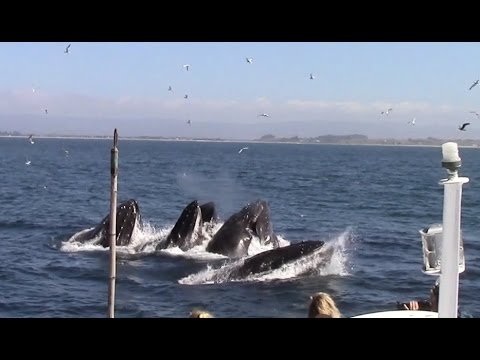

Relevant (y/n): 

 y


Wild(y/n): 

 y


Is there a location? (y/n): 

 y
 Monterey Bay, California


Response saved! Location : Monterey Bay, California.

Response saved! Relevant and Wild.

No more items to proceed.
The number of documents that still need to be manually filtered for collection "humpback whales" is 400.


In [16]:
howManyVideosToGoOver = 100 #change this number to number of videos you want to look through and annotate

# db.convertToUTC(saveTo) 
db.doManualFiltration(saveTo, howManyVideosToGoOver)
db.relevantDocuments(saveTo, nameOfDb) 

# Analytics

## Time Delay between Posting Times of Successive Posts

relevant: 859 

 Out of 1585 items, 54.2% are relevant.From those that are relevant, 99.8% are wild. Out of the total, 54.1% are wild 


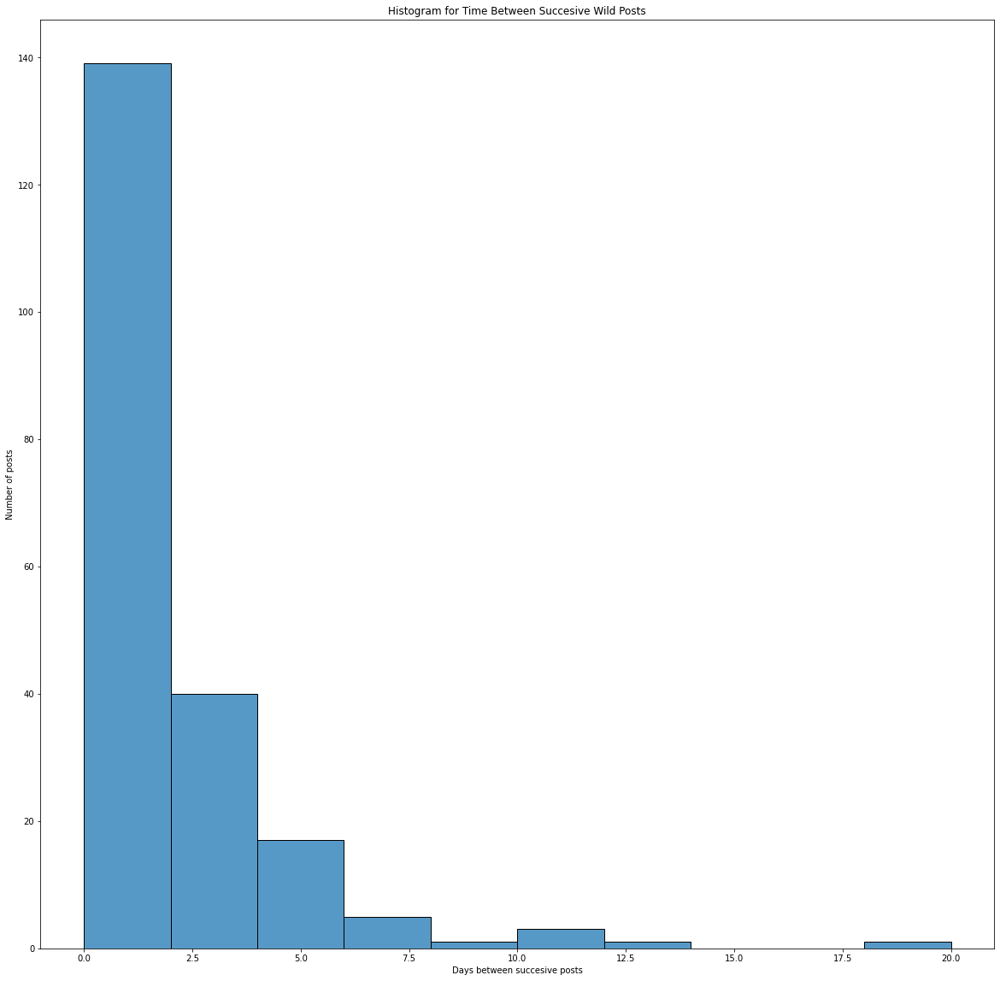

In [17]:
vs.showNumDocsRelevant(saveTo)
listOfDates = vs.showSuccessivePostsDelay(saveTo)

## Posts Per Week 

In [10]:
postsPerWeekDict, numOfPosts = db.postsPerWeek(listOfDates) 
smas = db.movingAveragePosts(3)

print("number of total videos within timeframe: {}\n".format(numOfPosts))

number of total videos within timeframe: 207



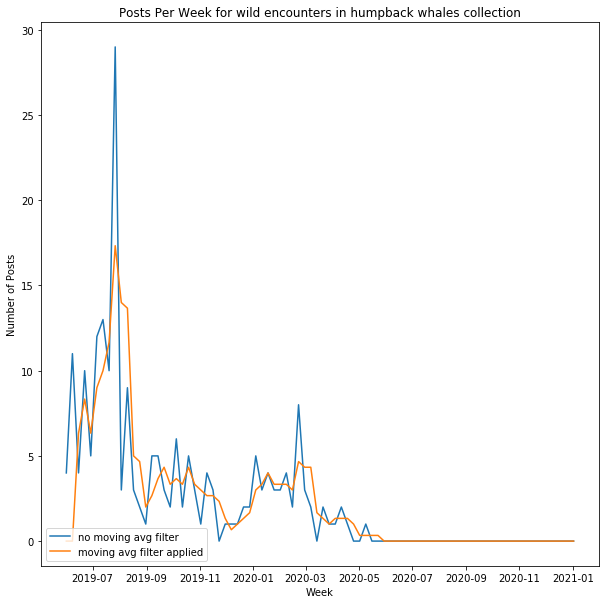

In [11]:
vs.plotPostsPerWeek(postsPerWeekDict, smas, saveTo)

## Visualizing Encounter & User Locations - All Species

In [65]:
# # saveTo = "humpback whales"
# # user_loc_csv_path = 'user locations/humpbackWhalesUsers.csv'

# # saveTo = "new whale sharks test"
# # user_loc_csv_path = 'user locations/WhaleSharksUsers.csv'

# # saveTo = 'iberian lynx'
# # user_loc_csv_path = 'user locations/IberianLynxUsers.csv'

# # saveTo = 'Reticulated Giraffe' #move to a new collection since old one is filled with spam
# # user_loc_csv_path = 'user locations/ReticulatedGiraffeUsers.csv'

# saveTo = 'grevys zebra'
# user_loc_csv_path = 'user locations/GrevysZebraUsers.csv'

# # saveTo = 'plains zebras'
# # user_loc_csv_path = 'user locations/PlainsZebraUsers.csv'


# species_info = {
#     'humpback whale': {'collection': 'humpback whales', 'user_csv_path':'user locations/humpbackWhalesUsers.csv' },
#     'whale shark': {'collection': 'new whale sharks test', 'user_csv_path':'user locations/WhaleSharksUsers.csv' },
#     'iberian lynx': {'collection': 'iberian lynx', 'user_csv_path': 'user locations/IberianLynxUsers.csv'},
#     'reticulated giraffe': {'collection': 'Reticulated Giraffe', 'user_csv_path': 'user locations/ReticulatedGiraffeUsers.csv' },
#     'grevy zebra':  {'collection': 'grevys zebra', 'user_csv_path': 'user locations/GrevysZebraUsers.csv'},
#     'plains zebra': {'collection': 'plains zebras', 'user_csv_path': 'user locations/PlainsZebraUsers.csv'}
# }

In [71]:
# # go through user location csv's and find the documents that have both user location AND encounter location

# df_all_species_coords = pd.DataFrame(columns = ['videoId', 'channelId', 'user_country', 'encounter_loc', 'enc_lat', 'enc_long', 'user_lat',\
#                                                'user_long', 'species'])
# for species, info_dict in species_info.items():
#     print(species)

#     #retrieve user locations
#     df_user_locations = pd.read_csv(info_dict['user_csv_path'])

#     #get user country, channel id, and videoID
#     video_channel_country_dics = db.makeVideoChannelCountryDicts(info_dict['collection'], df_user_locations) 

#     if video_channel_country_dics == []:
#         continue
        
#     #create a dataframe with coordinates
#     wild_collection = info_dict['collection'] + ' wild'
#     temp_df = geo.reverseGeocodeYT(wild_collection, video_channel_country_dics)

#     #specify species
#     temp_df['species'] = [species for i in range(len(temp_df))]

#     #append species dataframe to an overall df
#     frames = [df_all_species_coords, temp_df]
#     df_all_species_coords= pd.concat(frames)
#     print(df_all_species_coords.info())


In [70]:
# save dataframe as csv to avoid rerunning and waiting
# compression_opts = dict(method='zip',archive_name='yt_all_species_coordinates.csv')  
# df_all_species_coords.to_csv('yt_all_species_coordinates.zip', index=False, compression=compression_opts)

### Load in Saved Coordinate Data to Avoid Waiting

In [6]:
#load in species coord data from csv
df_all_species_coords = pd.read_csv('yt_all_species_coordinates.csv')
df_all_species_coords

,videoId,channelId,user_country,encounter_loc,enc_lat,enc_long,user_lat,user_long,species
0,rfOi6VSfxnY,UCcZ7AsxyPn7GvXGTCbMakuQ,United States,maui,20.802957,-156.310683,39.783730,-100.445882,humpback whale
1,G1JC6ifb9rc,UC-k1CfsXDMcOB9XOqh0Fhfg,Switzerland,hervey bay australia,-25.298578,152.853522,46.798562,8.231974,humpback whale
2,41vGo7iX6IY,UCUUWDzrkuEztzddaW_sgQbA,United States,New Jersey,40.075738,-74.404162,39.783730,-100.445882,humpback whale
3,-goUL-IvZFU,UClQK9j4uUAnrZamq1_FhtcQ,Canada,"Bonavista, Newfoundland",48.654176,-53.110338,61.066692,-107.991707,humpback whale
4,pNsvc3QsuUw,UCYs3EodFkeYFAVjd-PHQT0w,Canada,Vancouver Island,49.592949,-125.702557,61.066692,-107.991707,humpback whale
5,S-SiL1jn9Ho,UCYixHqQPVh0hDutTYFBBTIw,Portugal,"madeira, portugal",32.751749,-16.981752,40.033263,-7.889626,humpback whale
6,xyBX3ZqdUE0,UCAQpSHsgUcNt6uCOjpgD8kw,United States,Mexico,22.500048,-100.000038,39.783730,-100.445882,whale shark
7,5bcAF-KXpYk,UCUSQVSYVtAZhspHhLGqK-_A,Australia,Oslob,9.521231,123.432510,-24.776109,134.755000,whale shark
8,M7KvDhIGuL0,UCg6pUlin57zeWC6Y7xmBdhA,Mexico,isla mujeres,21.232105,-86.732228,22.500048,-100.000038,whale shark
9,vk9ASSGRz7c,UCEyktdIDxxqoK4bqNRpZpLg,Mexico,Mexico,22.500048,-100.000038,22.500048,-100.000038,whale shark


### Plotting User and Encounter Loc Data for ALL SPECIES

In [72]:
# Version 3
# Connecting Lines + Color Coded Encounter location coords; User coords --> black dots#
geo.plotEncounterAndUserLocationsAllSpeciesV3(df_all_species_coords, 'youtube', enc_locs = True, user_locs = True)

/Users/mramir71/anaconda3/lib/python3.7/site-packages/google/colab/data_table.py:30: UserWarning:

IPython.utils.traitlets has moved to a top-level traitlets package.



In [12]:
## Version 3 but for individual species
## Connecting Lines + Color Coded Encounter location coords; User coords --> black dots#

# species = 'humpback whale'
# species = 'whale shark'
# species = 'iberian lynx'
# species = 'reticulated giraffe'
# species = 'grevy zebra'
species = 'plains zebra'

df_species_coords = df_all_species_coords[df_all_species_coords['species'] == species]

geo.plotEncounterAndUserLocationsAllSpeciesV4(species, df_species_coords, 'youtube', enc_locs = True, user_locs = True)

In [75]:
avg_dist_df = geo.getAverageDistancePerSpecies(df_all_species_coords)
avg_dist_df

5078.130446556198
5912.430881432623
none
13825.5522785374
none
7456.515004239911


,species,avg_distance
0,humpback whale,5078.130447
1,whale shark,5912.430881
2,iberian lynx,NaN
3,reticulated giraffe,13825.552279
4,grevy zebra,NaN
5,plains zebra,7456.515004


## Visualizing Encounter & User Locations - Individual

#### Getting User and Encounter Locations for Automated Geospatial Map Generation

In [13]:
#for relevant, wild documents, make sure all docs have a newLocation field,
#if there is no location, newLocation = 0 
wild_collection = saveTo + " wild"
db.addLocationField(wild_collection)

In [15]:
## 1. get video ids of each video within timeframe
listOfVideoIDs = db.getVideoIDs(wild_collection)

207


In [19]:
## 2. map each channel id to its respective videoID
video_channel_dic = yt.getChannelIds(listOfVideoIDs) 

In [22]:
## 3.Get countries for each channel_id
video_channel_country_dics = yt.getUserCountries(video_channel_dic)

In [24]:
#update all docs in general and wild species collections with 'channelId' and 'user_country' fields
db.updateDocsChannelCountry(saveTo, wild_collection, video_channel_country_dics)

In [32]:
#populate a dataframe that maps both user and encounter locs to each wild encounter video
df_coords = geo.reverseGeocodeYT(wild_collection, video_channel_country_dics)

46
Error in enc locs:  Danco Island, Antarctica 4
Error in enc locs:  Ningaloo reed 5
44
44
44
44


In [39]:
#save df_coords to a CSV file for easy future access
file_name = saveTo.replace(' ', '_') + '_encounter_and_user_locs'
compression_opts = dict(method='zip',archive_name=file_name + '.csv')  
df_coords.to_csv(file_name + '.zip', index=False, compression=compression_opts)

## To Load in Existing Geo Data on Videos:
- Skip Cells Above and Just Run the Following Cell

In [ ]:
#deleted cell - loaded csv file in here

## Number of Posts Geotagged - YT

In [14]:
df_coords = df_coords.reset_index(drop = True)
df_coords

,videoId,channelId,user_country,encounter_loc,enc_lat,enc_long,user_lat,user_long
0,rfOi6VSfxnY,UCcZ7AsxyPn7GvXGTCbMakuQ,United States,maui,20.802957,-156.310683,39.783730,-100.445882
1,0GuvNXJLg4c,UCaklXD3fgyuCTb4mXQMbJhw,Sweden,Boston,42.360253,-71.058291,59.674971,14.520858
2,G1JC6ifb9rc,UC-k1CfsXDMcOB9XOqh0Fhfg,Switzerland,hervey bay australia,-25.298578,152.853522,46.798562,8.231974
3,41vGo7iX6IY,UCUUWDzrkuEztzddaW_sgQbA,United States,New Jersey,40.075738,-74.404162,39.783730,-100.445882
4,-goUL-IvZFU,UClQK9j4uUAnrZamq1_FhtcQ,Canada,"Bonavista, Newfoundland",48.654176,-53.110338,61.066692,-107.991707
5,pNsvc3QsuUw,UCYs3EodFkeYFAVjd-PHQT0w,Canada,Vancouver Island,49.592949,-125.702557,61.066692,-107.991707
6,S-SiL1jn9Ho,UCYixHqQPVh0hDutTYFBBTIw,Portugal,"madeira, portugal",32.751749,-16.981752,40.033263,-7.889626
7,098O0Zu_A3E,UCg178cchFvhCClnLWSR5iAw,United Kingdom,River Thames,51.560153,-0.779371,54.702355,-3.276575
8,8TQGAxqb0tE,UCVhtkN7-c8mA8GXEoxS4YQw,United States,San Francisco Bay,37.714029,-122.307794,39.783730,-100.445882
9,I8Hs1_1WYVg,UC5ovaFtNA0Jbq7mf0vdKYjg,Ireland,Southern California Coast,37.077807,-122.050771,52.865196,-7.979460


## Plot Wild Encounter Locations and Corresponding User Locations
- note: when running this notebook in jupyterlab, map does not show up, but if run as a jupyter notebook, function works fine

In [23]:
geo.plotEncounterAndUserLocations(saveTo, df_coords, 'youtube', enc_locs = True, user_locs = True)

## Differences in Distance Between Encounter Location and User Locations of Wild Encounters

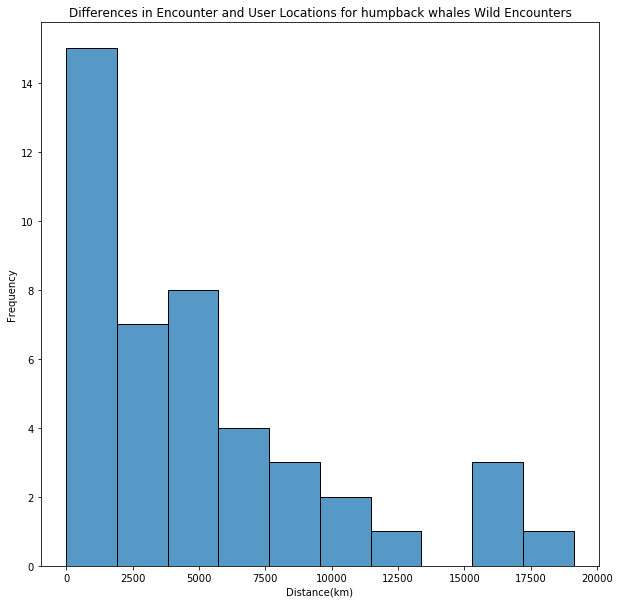

In [24]:
geo.visualizeDistanceDifferences(df_coords, saveTo)

# Close Database Connection

In [18]:
db.close()